<font size="10"> **Object Detection Model Implementation**

<font size="6"> Imports and setting preperations

In [1]:
from keras.optimizers import Adam
import tensorflow as tf
import numpy as np
from google.colab.patches import cv2_imshow
import cv2
import matplotlib.pyplot as plt
import torch
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from keras.models import Model
from sklearn.model_selection import train_test_split
import albumentations as A
import os

In [2]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [3]:
print(f"Is cuda available: {torch.cuda.is_available()}")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"The device is: {device}")

Is cuda available: True
The device is: cuda


<font size="6"> Helper functions for future use

In [10]:
# This function returns the model's prediction of label and object detection box
def predict_image(image, model):
  # pre process the image so is would fit the model's expected input
  image = img_to_array(image) / 255.0
  image = np.expand_dims(image, axis=0)

  # predict the label and the bounding box of the object in the image
  label, box = model.predict(image)
  return label, box


# This function draws the label and the object's box on the image, according to the given predictions
def prepare_image(image, label_pred, box_pred):
  (h, w) = image.shape[:2]

  # normalize the predicted bounding box coordinates using the image's dimensions
  xmin, ymin, xmax, ymax = box_pred[0]
  xmin = int(xmin * w)
  ymin = int(ymin * h)
  xmax = int(xmax * w)
  ymax = int(ymax * h)

  # get the label from the label prediction array
  label = "dog" if np.argmax(label_pred) else "cat"

  # draw the predicted bounding box and the class label on the input image
  y = ymin - 12 if ymin - 12 > 12 else ymin + 12
  cv2.putText(image, label, (xmin, y), cv2.FONT_HERSHEY_SIMPLEX, 0.65, (255, 0, 255 * int(np.argmax(label_pred))), 2)
  cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 0, 255 * int(np.argmax(label_pred))), 2)

  return image

# This function plots the given image with its label and bounding box
def plot_image(image, label, box):
  image = np.array(image) * 255
  prepare_image(image, label, [box])
  cv2_imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))


<font size="6"> Data Preperation

The dataset for our object detection project is ["Oxford Pets Dataset"](https://public.roboflow.com/object-detection/oxford-pets) from Roboflow, that detects and classifies dogs and cats.

In [5]:
%%capture
!wget https://public.roboflow.com/ds/GEEc9PXzih?key=JOMm9aRRMN -O Dataset.zip
!unzip Dataset.zip -d Dataset

Load images and their labels + bounding boxes for the training and validation process

In [6]:
images = []
boxes = []
labels = []

# iterate through the train folder and the validation folder
for i in range(2):
  if i == 0:
    folder = "./Dataset/train/"
  else:
    folder = "./Dataset/valid/"

  with open(folder + "_annotations.csv") as f:
    rows = f.read().strip().split("\n")

  # iterate through each image and load its data
  for row in rows[1:]:
    row = row.split(",")
    # load the image's label and bounding box data
    image_name, _, _, label, xmin, ymin, xmax, ymax = row

    # load the image to get its width and height
    image = cv2.imread(folder + image_name)
    (h, w) = image.shape[:2]

    # devide the datapoints by the width and height of the image to get the relative coordinates
    xmin = float(xmin) / w
    ymin = float(ymin) / h
    xmax = float(xmax) / w
    ymax = float(ymax) / h

    # save the data
    image = load_img(folder + image_name, target_size=(224,224))
    images.append(img_to_array(image))
    boxes.append((xmin, ymin, xmax, ymax))
    labels.append([1,0] if label == "cat" else [0,1])

# normalize the images data
images = np.array(images, dtype='float32') / 255.0
boxes = np.array(boxes, dtype='float32')
labels = np.array(labels)

Split the data into training set and validation set

In [15]:
# split to training set and validation set with the proportion of 0.18/0.82
split = train_test_split(images, boxes, labels, test_size=0.18)
(train_images, validate_images) = split[:2]
(train_boxes, validate_boxes) = split[2:4]
(train_labels, validate_labels) = split[4:]

print("The training arrays shapes are:")
print(train_images.shape, train_boxes.shape, train_labels.shape)
print("\nThe validations arrays shapes are:")
print(validate_images.shape, validate_boxes.shape, validate_labels.shape)

The training arrays shapes are:
(2720, 224, 224, 3) (2720, 4) (2720, 2)

The validations arrays shapes are:
(598, 224, 224, 3) (598, 4) (598, 2)


<font size="6"> Data Augmentation

Data augmentation setup

In [8]:
# 'albumentations' format uses the four normalized values [x_min, y_min, x_max, y_max] to represent a bounding box, just like us
bbox_params=A.BboxParams(format='albumentations', label_fields=['label'])

transform = A.Compose([
    A.ShiftScaleRotate(p=1),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=1),
    A.RandomCrop(170, 170),
    A.Resize(224, 224),
    A.RandomGamma(p=0.5)],
  bbox_params=bbox_params)

Augmentation demonstration on a single image, to show that the same transform outputs different augmentations due to its randomness.

Original Image:


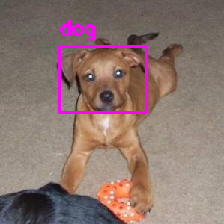


Transformed image example 1:


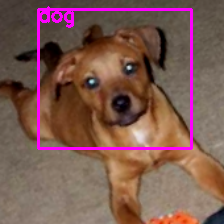


Transformed image example 2:


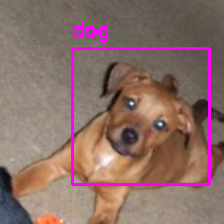

In [16]:
index = 0 # change the index to get different images
print("Original Image:")
plot_image(train_images[index], train_labels[index], train_boxes[index])

print("\nTransformed image example 1:")
transformed = transform(image=np.array(train_images[index]), bboxes=[train_boxes[index]], label=[train_labels[index]])
plot_image(transformed['image'], transformed['label'][0], transformed['bboxes'][0])

print("\nTransformed image example 2:")
transformed = transform(image=np.array(train_images[index]), bboxes=train_boxes[index:index+1], label=train_labels[index:index+1])
plot_image(transformed['image'], transformed['label'][0], transformed['bboxes'][0])

Add augmented images to the train set

In [17]:
print("The shape of the train images array before augmentation is: " + str(train_images.shape))
print("The shape of the train boxes array before augmentation is: " + str(train_boxes.shape))
print("The shape of the train labels array before augmentation is: " + str(train_labels.shape))

# Use temporary helper small arrays to avoid memory overload
augmented_images = np.expand_dims(np.copy(train_images[0]), axis=0)
augmented_boxes = np.expand_dims(np.copy(train_boxes[0]), axis=0)
augmented_labels = np.expand_dims(np.copy(train_labels[0]), axis=0)

# Augment every 8th image in the train set
for index in range(1, len(train_images), 6):
  transformed = transform(image=np.array(train_images[index:index+1][0]), bboxes=train_boxes[index:index+1], label=train_labels[index:index+1])
  # validate that the transform augmentation didn't crop out the bounding box
  if (len(transformed['bboxes']) > 0):
    augmented_images = np.append(augmented_images, np.expand_dims(transformed['image'], axis=0), axis=0)
    augmented_boxes = np.append(augmented_boxes, np.expand_dims(np.array(transformed['bboxes'][0]), axis=0), axis=0)
    augmented_labels = np.append(augmented_labels, np.expand_dims(transformed['label'][0], axis=0), axis=0)

# add the augmented images to our training set
train_images = np.concatenate((train_images, augmented_images), axis=0)
train_boxes = np.concatenate((train_boxes, augmented_boxes), axis=0)
train_labels = np.concatenate((train_labels, augmented_labels), axis=0)

print("\nThe shape of the train images array after augmentation is: " + str(train_images.shape))
print("The shape of the train boxes array after augmentation is: " + str(train_boxes.shape))
print("The shape of the train labels array after augmentation is: " + str(train_labels.shape))



The shape of the train images array before augmentation is: (2720, 224, 224, 3)
The shape of the train boxes array before augmentation is: (2720, 4)
The shape of the train labels array before augmentation is: (2720, 2)

The shape of the train images array after augmentation is: (3173, 224, 224, 3)
The shape of the train boxes array after augmentation is: (3173, 4)
The shape of the train labels array after augmentation is: (3173, 2)


<font size="4">Release RAM memory

In [18]:
# free memory
augmented_images = None
augmented_boxes = None
augmented_labels = None
transformed = None
transform = None
images = None
boxes = None
labels = None

<font size="4"> Define the IoU evaluation metric

In [19]:
# This function calculates the intersection over union (IoU) for bounding boxes, for there arguments:
# y_true: true bounding box coordinates, shape: (batch_size, 4)
# y_pred: predicted bounding box coordinates, shape: (batch_size, 4)
def calculate_iou(y_true, y_pred):
    # extract true and predicted bounding box coordinates
    true_x1, true_y1, true_x2, true_y2 = tf.split(y_true, 4, axis=1)
    pred_x1, pred_y1, pred_x2, pred_y2 = tf.split(y_pred, 4, axis=1)

    # calculate intersection coordinates
    intersection_x1 = tf.maximum(true_x1, pred_x1)
    intersection_y1 = tf.maximum(true_y1, pred_y1)
    intersection_x2 = tf.minimum(true_x2, pred_x2)
    intersection_y2 = tf.minimum(true_y2, pred_y2)

    # calculate intersection area
    intersection_area = tf.maximum(0.0, intersection_x2 - intersection_x1) * tf.maximum(0.0, intersection_y2 - intersection_y1)

    # calculate true and predicted bounding box areas
    true_area = (true_x2 - true_x1) * (true_y2 - true_y1)
    pred_area = (pred_x2 - pred_x1) * (pred_y2 - pred_y1)

    # calculate Union area + add a small epsilon to avoid division by zero
    union_area = true_area + pred_area - intersection_area + 1e-7

    # calculate and return the IoU
    iou = intersection_area / union_area

    return iou

# This function is used for the IoU metric wrap
def iou_metric(y_true, y_pred):
    return tf.reduce_mean(calculate_iou(y_true, y_pred))


<font size="6"> Model Training

Set up the model backbone and head layers

In [20]:
# get the backbone of the VGG16 network
vgg16 = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))
vgg16.trainable = False

# customize the head layers of the model
layers = tf.keras.layers.Flatten()(vgg16.output)
layers = tf.keras.layers.Dense(150, activation='relu')(layers)
layers = tf.keras.layers.Dense(70, activation='relu')(layers)
layers = tf.keras.layers.Dropout(0.2)(layers)
layers = tf.keras.layers.Dense(35, activation='relu')(layers)

# create an output layer for the bounding box perdictions
output_box = tf.keras.layers.Dense(4, activation='sigmoid', name='Output_Box')(layers)

# add fully connected layers to the model for the label perdictions
layers = tf.keras.layers.Dense(500, activation="relu")(layers)
layers = tf.keras.layers.Dropout(0.3)(layers)
layers = tf.keras.layers.Dense(150, activation="relu")(layers)
layers = tf.keras.layers.Dropout(0.3)(layers)

# create an output layer for the class label predictions
output_label = tf.keras.layers.Dense(2, activation='softmax', name='Output_Label')(layers)

# create the model
model = tf.keras.models.Model(vgg16.input, [output_label, output_box])
print(model.summary())

# set the model with appropriate optimizer and loss functions
model.compile(
    optimizer = Adam(learning_rate=0.000005),
    loss = {"Output_Label": "categorical_crossentropy",	"Output_Box": "mse"},
    loss_weights = {"Output_Label": 2, "Output_Box": 9},
    metrics = {"Output_Label": ['accuracy'],  "Output_Box": ['accuracy', iou_metric]})


58889256/58889256 [==============================] - 2s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 224, 224, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 block1_conv2 (Conv2D)       (None, 224, 224, 64)         36928     ['block1_conv1[0][0]']        
                                                                                                  
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)         0         ['block1_conv2[0][0]']        
                             

Create a tensor board to monitor the model training

In [21]:
%tensorboard --logdir Logs

log_dir = "./Logs"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

<IPython.core.display.Javascript object>

Train the model

In [22]:
# train the model with appropriate number of epochs and batch sizes
model_history = model.fit(
    train_images,
    [train_labels, train_boxes],
    epochs = 20,
    validation_data=(validate_images, [validate_labels, validate_boxes]),
    batch_size = 18,
    callbacks=[tensorboard_callback])

# save model so we'll be able to load it in case of a crash
model.save('object_detection_model.h5')

Epoch 1/20
177/177 [==============================] - 30s 111ms/step - loss: 1.7569 - Output_Label_loss: 0.6755 - Output_Box_loss: 0.0451 - Output_Label_accuracy: 0.5745 - Output_Box_accuracy: 0.5317 - Output_Box_iou_metric: 0.1938 - val_loss: 1.3870 - val_Output_Label_loss: 0.5953 - val_Output_Box_loss: 0.0218 - val_Output_Label_accuracy: 0.7124 - val_Output_Box_accuracy: 0.7090 - val_Output_Box_iou_metric: 0.3547
Epoch 2/20
177/177 [==============================] - 13s 74ms/step - loss: 1.5268 - Output_Label_loss: 0.6352 - Output_Box_loss: 0.0285 - Output_Label_accuracy: 0.6502 - Output_Box_accuracy: 0.6943 - Output_Box_iou_metric: 0.3052 - val_loss: 1.3110 - val_Output_Label_loss: 0.5677 - val_Output_Box_loss: 0.0195 - val_Output_Label_accuracy: 0.7124 - val_Output_Box_accuracy: 0.7074 - val_Output_Box_iou_metric: 0.3792
Epoch 3/20
177/177 [==============================] - 12s 70ms/step - loss: 1.4505 - Output_Label_loss: 0.6093 - Output_Box_loss: 0.0258 - Output_Label_accuracy: 0

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


View the model training history loss

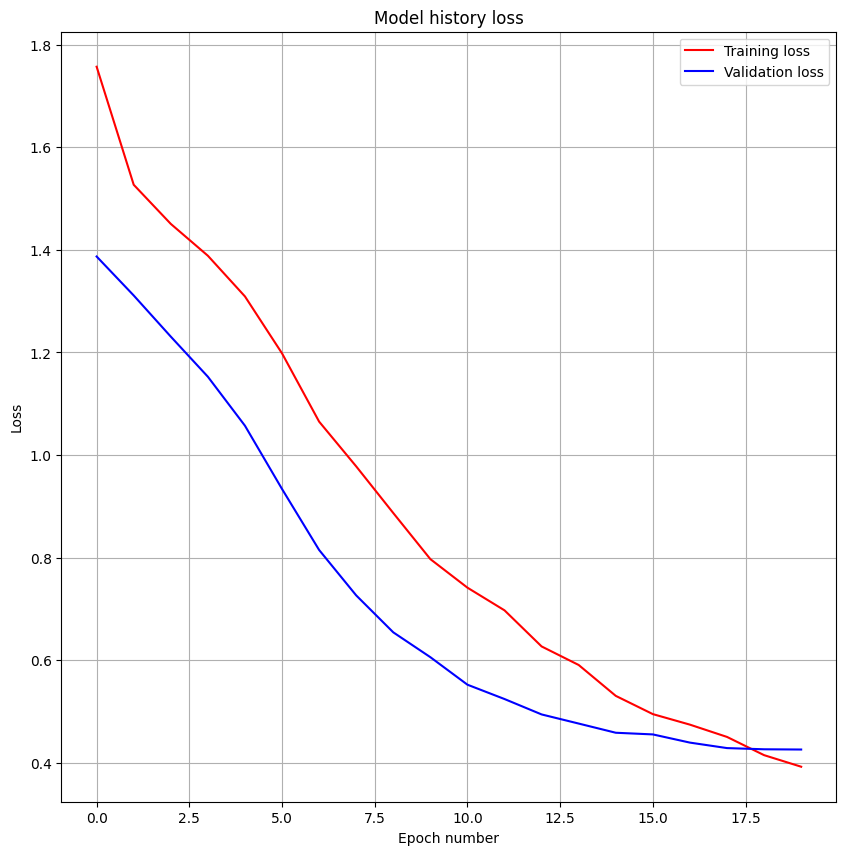

In [23]:
plt.figure(figsize=(10, 10))

# plot the losses
plt.plot(model_history.history['loss'], label='Training loss', color='red')
plt.plot(model_history.history['val_loss'], label='Validation loss', color='blue')
plt.xlabel('Epoch number')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.title("Model history loss")
plt.show()

<font size="6"> Model's performance

Test on images - load 9 random images from the test dataset (which we haven't used in the training process) and use our model for object detection.

1/1 [==============================] - 0s 20ms/step


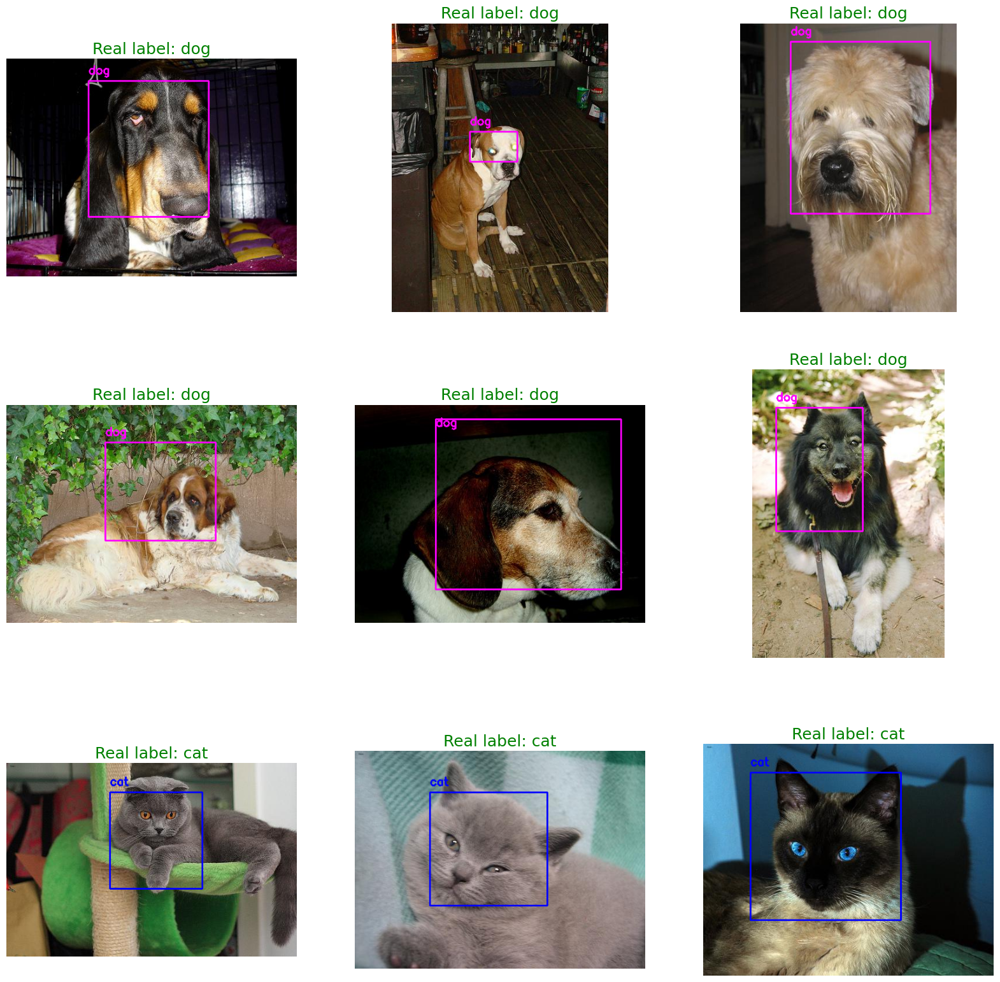

In [36]:
# Reload model in case there was a crash
# model = load_model('object_detection_model.h5')

image_names = []
labels = []

# load the test images metadata
test_folder = "./Dataset/test/"
rows = open(test_folder + "_annotations.csv").read().strip().split("\n")
for row in rows[1:]:
  row = row.split(",")
  (image_name, _, _, label, _, _, _, _) = row
  image_names.append(image_name)
  labels.append(label)

# select 9 random indexes to be our test images
selected_indexes = np.random.choice(len(image_names), size=9, replace=False)

plt.figure(figsize=(20, 20))

# iterate through the selected images
for i,index in enumerate(selected_indexes):
  image_path = test_folder + image_names[index]
  # use our model for object detection perdiction
  label_prediction, box_prediction = predict_image(load_img(image_path, target_size=(224, 224)), model)
  # draw the perdictions on the image
  image = prepare_image(cv2.imread(image_path), label_prediction, box_prediction)
  label_color = 'green' if labels[index] == ("dog" if np.argmax(label_prediction) else "cat")  else 'red'
  plt.subplot(3, 3, i+1)
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
  plt.title("Real label: " + labels[index], fontsize=18, color=label_color)
  plt.axis('off')

plt.show()

Test our model on a dog video and on a cat video

In [28]:
def process_video(video_path):
  # capture the input video
  cap = cv2.VideoCapture(video_path)

  # get video properties
  fps = int(cap.get(cv2.CAP_PROP_FPS))
  width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
  height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

  # create VideoWriter for the output video
  fourcc = cv2.VideoWriter_fourcc(*'mp4v')
  output_path = os.path.join(os.path.dirname(video_path), "Output_" + os.path.basename(video_path))
  out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

  # iterate through each frame in the video
  while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # predict the bounding box of the object along with the class
    label_prediction, box_prediction = predict_image(cv2.resize(frame, (224, 224)), model)

    # draw the perdictions on the frame
    processed_frame = prepare_image(frame, label_prediction, box_prediction)

    # write the processed frame to the output video
    out.write(np.uint8(processed_frame))

  # release everything when the job is done
  cap.release()
  out.release()
  cv2.destroyAllWindows()

In [29]:
%%capture
video_path = './Videos/catVideo1.mp4' # The dog video should be uploaded with this name to this path
process_video(video_path)

video_path = './Videos/catVideo2.mp4' # The dog video should be uploaded with this name to this path
process_video(video_path)

video_path = './Videos/dogVideo1.mp4' # The dog video should be uploaded with this name to this path
process_video(video_path)

video_path = './Videos/dogVideo2.mp4' # The dog video should be uploaded with this name to this path
process_video(video_path)

Checkout the output videos containing the model's demonstrations in the `Videos ` folder!